# PROBLEM STATEMENT

The objective of this project is to forecast the number of covid cases from previous data. We will use **Facebook's Prophet Model** to conduct our forecasting.
We will also conduct exploratory data analysis to gain an understanding of trends in covid cases across countries

# Data

The dataset is publicly available on Kaggle. We can find the dataset at [https://www.kaggle.com/datasets/sambelkacem/covid19-algeria-and-world-dataset/data]

The dataset consists of covid cases, deaths, and tests for over 80 countries from the beginning of 2020 to the end of October 2020. Therefore it consists of 7 attributes and 20645 records. The attributes of the data are as follows:
- Entity: Country Name
- Date: Date on which records were observed
- Cases: Number of confirmed Covid-19 cases
- Deaths: Number of confirmed Covid-19 related deaths
- Daily tests: Number of tests taken in the country
- Iso_alpha: ISO code for countries
- Month: Month of observation

#### Importing Dataset and Libraries

In [39]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.figure_factory as ff
from prophet import Prophet
from sklearn.metrics import r2_score

In [2]:
data = pd.read_csv(r"D:\Projects\Facebook Prophet\Covid Cases Prediction\covid_data.csv")
data

,Entity,Date,Cases,Deaths,Daily tests,iso_alpha,month
0,Mexico,2020-01-01,0.0,0.0,25.0,MEX,1
1,Mexico,2020-01-02,0.0,0.0,72.0,MEX,1
2,Mexico,2020-01-03,0.0,0.0,89.0,MEX,1
3,Thailand,2020-01-04,0.0,0.0,2.0,THA,1
4,Mexico,2020-01-04,0.0,0.0,45.0,MEX,1
...,...,...,...,...,...,...,...
20640,Saudi Arabia,2020-10-31,346880.0,5383.0,44840.0,SAU,10
20641,United States,2020-10-31,9047427.0,229708.0,1161427.0,USA,10
20642,South Africa,2020-10-31,723682.0,19230.0,22150.0,ZAF,10
20643,Malawi,2020-10-31,5923.0,184.0,0.0,MWI,10


#### Overview of the dataset

In [3]:
# Checking null values
data.isna().sum()

Entity         0
Date           0
Cases          0
Deaths         0
Daily tests    0
iso_alpha      0
month          0
dtype: int64

There is no missing data which significantly reduces the preprocessing efforts

In [4]:
# Getting dataframe info
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20645 entries, 0 to 20644
Data columns (total 7 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   Entity       20645 non-null  object 
 1   Date         20645 non-null  object 
 2   Cases        20645 non-null  float64
 3   Deaths       20645 non-null  float64
 4   Daily tests  20645 non-null  float64
 5   iso_alpha    20645 non-null  object 
 6   month        20645 non-null  int64  
dtypes: float64(3), int64(1), object(3)
memory usage: 1.1+ MB


In [5]:
# Statistical data of the dataframe
data.describe()

,Cases,Deaths,Daily tests,month
count,2.064500e+04,20645.000000,2.064500e+04,20645.000000
mean,1.247184e+05,4693.475902,2.248130e+04,6.401259
std,6.068402e+05,17873.361923,1.055780e+05,2.399602
min,0.000000e+00,0.000000,-3.743000e+03,1.000000
25%,1.086000e+03,11.000000,9.700000e+01,4.000000
50%,8.698000e+03,196.000000,2.216000e+03,6.000000
75%,5.545200e+04,1522.000000,1.025400e+04,8.000000
max,9.047427e+06,229708.000000,1.492409e+06,10.000000


In [6]:
# Sort the dataframe by Date
data.sort_values('Date',ascending=True,inplace=True)

In [7]:
# Print the number of countries considered
print("Total Number of Countries:", data['Entity'].nunique())

Total Number of Countries: 83


Total unique countries in the dataset are 83, to know which countries are among the 83, we can view the unique values of the Entity column

In [8]:
# Print the name of Countries
print('Countries on which have data are:\n')

for i in data['Entity'].unique():
      print(i+'\n')

Countries on which have data are:

Mexico

Thailand

Japan

United States

Vietnam

Switzerland

Nepal

France

Australia

Malaysia

Canada

Denmark

Israel

Czech Republic

Sri Lanka

India

Philippines

Finland

Italy

Sweden

United Kingdom

Belgium

South Africa

Guatemala

Iran

Morocco

Kuwait

Bahrain

Norway

Oman

Iraq

Austria

Croatia

Algeria

Pakistan

Romania

Greece

Iceland

Serbia

New Zealand

Senegal

Nigeria

Ireland

Ecuador

Portugal

Saudi Arabia

Dominican Republic

Indonesia

Bangladesh

Jordan

Tunisia

Chile

Poland

Togo

Libya

Slovenia

Hungary

Peru

Costa Rica

Paraguay

Colombia

Bulgaria

Panama

Bolivia

Jamaica

Turkey

Cuba

Trinidad and Tobago

Ghana

Kenya

Ethiopia

Mauritania

Namibia

Uruguay

Rwanda

Zambia

El Salvador

Madagascar

Zimbabwe

Uganda

Mozambique

Myanmar

Malawi



Nearly all the major nations are present but there are 3 significant nations not included in the data which are China, Russia, and Brasil

#### Exploratory Data Analysis

There are 3 variables that can be plotted over time in this dataset. We define a function to directly get an interactive line chart plotting cases, tests, and deaths over time

In [67]:
def interactive_plot(df,column_name,title):
    fig = px.line(title = title)
    for i in df['Entity'].unique():
        d = df[df['Entity']==i]
        fig.add_scatter(x = d['Date'],y= d[column_name], name = i)
    fig.show()

In [68]:
interactive_plot(data,'Cases','Covid Cases')

While all the other countries showed gradual increase in cases as expected, in United states and India, the cases have simply skyrocketed. The initial period of lockdown in India prevented this exponential increase early on but eventually the cases still rose up

In [54]:
interactive_plot(data,'Daily tests','Daily Tests')

The daily tests seem to follow a pattern of rapid crests and troughs. And this pattern is observed for all countries. It is possible that since symptoms of Covid-19 do not appear instantaneously, reportings in many cases would be delayed. It could also be an indicator of a resource constraint on all nations

In [12]:
interactive_plot(data,'Deaths','Deaths over time')

The fact that the plot of deaths is slightly less skewed with US and India means that while other countries had lower number of cases, the mortality rate in those countries was higher and prime examples of these are Mexico, France, Italy and the UK, which show quite a lot of deaths but are far below US and India in terms of cases

In [71]:
def choropleth(df,column_name,title):
    fig = px.choropleth(df,locations= 'iso_alpha',
                    color=column_name,
                    hover_name='Entity',
                    animation_frame='month',
                    title = title)
    fig.show()

In [72]:
choropleth(data,'Cases','Cases Over Time & Country')

We have used an animation chart here to map out the progression of cases over the 10 month period for all the countries that have been considered in our dataset. The progression animation shows how initally European nations along with USA had higher number of cases while most african and asian nations had very few, and following June, suddenly cases in India skyrocketed to the point where rest of the word was having thousands or hundreds of thousands of cases, while India and US had cases in the millions

In [73]:
choropleth(data,'Deaths','Deaths Over Time & Country')

As was also visible from the lineplot, the deaths are somewhat more uniform, owing to the higher mortality rates in countries like Mexico and some European and South American nations

We can also plot the same map with date level data increasing the granularity of the data and allowing deeper insights, although the visual does face lag with higher date ranges

In [17]:
fig = px.choropleth(data,locations= 'iso_alpha',
                    color='Cases',
                    hover_name='Entity',
                    animation_frame='Date')
fig.show()

#### Preparing data for forecasting

In [75]:
data

,Entity,Date,Cases,Deaths,Daily tests,iso_alpha,month
0,Mexico,2020-01-01,0.0,0.0,25.0,MEX,1
1,Mexico,2020-01-02,0.0,0.0,72.0,MEX,1
2,Mexico,2020-01-03,0.0,0.0,89.0,MEX,1
3,Thailand,2020-01-04,0.0,0.0,2.0,THA,1
4,Mexico,2020-01-04,0.0,0.0,45.0,MEX,1
...,...,...,...,...,...,...,...
20585,Australia,2020-10-31,27582.0,907.0,0.0,AUS,10
20584,India,2020-10-31,8137119.0,121641.0,1067976.0,IND,10
20583,New Zealand,2020-10-31,1601.0,25.0,4401.0,NZL,10
20591,France,2020-10-31,1331984.0,36565.0,175333.0,FRA,10


To conduct forecasting properly, the cases would have to be aggregated at the date level for all countries, since the FB Prophet model only considers dates and the forecast column for the model training

In [81]:
date_data = data[['Date','Cases']]

data_agg = date_data.groupby('Date').sum('Cases').reset_index()

In [82]:
data_agg

,Date,Cases
0,2020-01-01,0.0
1,2020-01-02,0.0
2,2020-01-03,0.0
3,2020-01-04,0.0
4,2020-01-05,0.0
...,...,...
300,2020-10-27,31344249.0
301,2020-10-28,31691206.0
302,2020-10-29,32066452.0
303,2020-10-30,32469621.0


For FBprophet to work, we need the column names to be specific. 'ds' for the date and 'y' for the forecast variable

In [83]:
# These are the column names expected by fbprophet
data_agg.rename(columns={'Date':'ds','Cases':'y'},inplace=True)
data_agg

,ds,y
0,2020-01-01,0.0
1,2020-01-02,0.0
2,2020-01-03,0.0
3,2020-01-04,0.0
4,2020-01-05,0.0
...,...,...
300,2020-10-27,31344249.0
301,2020-10-28,31691206.0
302,2020-10-29,32066452.0
303,2020-10-30,32469621.0


In [84]:
# Split the data into testing and training datasets
train , test = data_agg[ data_agg['ds'] <= '2020-09-30'], data_agg[data_agg['ds'] >=  '2020-10-01']

In [85]:
train

,ds,y
0,2020-01-01,0.0
1,2020-01-02,0.0
2,2020-01-03,0.0
3,2020-01-04,0.0
4,2020-01-05,0.0
...,...,...
269,2020-09-26,23255672.0
270,2020-09-27,23489065.0
271,2020-09-28,23689613.0
272,2020-09-29,23868011.0


In [86]:
test

,ds,y
274,2020-10-01,24307543.0
275,2020-10-02,24542573.0
276,2020-10-03,24777086.0
277,2020-10-04,25009638.0
278,2020-10-05,25219783.0
279,2020-10-06,25423117.0
280,2020-10-07,25648579.0
281,2020-10-08,25904671.0
282,2020-10-09,26169777.0
283,2020-10-10,26439716.0


We have separated the data into train and test sets, our test set is the data for october which we will predict and compare with our model to determine its effectiveness

#### Model Training and Testing

Now we can begin training the model

In [87]:
m = Prophet()

In [88]:
# Create and fit the prophet model to the training data
m.fit(train)

23:32:34 - cmdstanpy - INFO - Chain [1] start processing
23:32:35 - cmdstanpy - INFO - Chain [1] done processing


We are going to forecast for the 31 days following September 30th, therefore we create a dataframe that has values for all the training dates as well as the testing dates

In [90]:
future = m.make_future_dataframe(periods=31)

In [93]:
# Make prediction 
forecast = m.predict(future)

forecast

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,weekly,weekly_lower,weekly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2020-01-01,-8.075322e+02,-7.922600e+04,6.411813e+04,-8.075322e+02,-8.075322e+02,-5812.044955,-5812.044955,-5812.044955,-5812.044955,-5812.044955,-5812.044955,0.0,0.0,0.0,-6.619577e+03
1,2020-01-02,-7.822688e+02,-8.501927e+04,6.730107e+04,-7.822688e+02,-7.822688e+02,-7181.154451,-7181.154451,-7181.154451,-7181.154451,-7181.154451,-7181.154451,0.0,0.0,0.0,-7.963423e+03
2,2020-01-03,-7.570054e+02,-7.391076e+04,6.889500e+04,-7.570054e+02,-7.570054e+02,-1550.840932,-1550.840932,-1550.840932,-1550.840932,-1550.840932,-1550.840932,0.0,0.0,0.0,-2.307846e+03
3,2020-01-04,-7.317419e+02,-6.407289e+04,7.618260e+04,-7.317419e+02,-7.317419e+02,6725.832842,6725.832842,6725.832842,6725.832842,6725.832842,6725.832842,0.0,0.0,0.0,5.994091e+03
4,2020-01-05,-7.064785e+02,-6.506316e+04,8.776532e+04,-7.064785e+02,-7.064785e+02,9451.689139,9451.689139,9451.689139,9451.689139,9451.689139,9451.689139,0.0,0.0,0.0,8.745211e+03
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
300,2020-10-27,2.915076e+07,2.879779e+07,2.942748e+07,2.880621e+07,2.943689e+07,-4735.412457,-4735.412457,-4735.412457,-4735.412457,-4735.412457,-4735.412457,0.0,0.0,0.0,2.914603e+07
301,2020-10-28,2.934740e+07,2.897268e+07,2.964922e+07,2.897962e+07,2.964752e+07,-5812.044955,-5812.044955,-5812.044955,-5812.044955,-5812.044955,-5812.044955,0.0,0.0,0.0,2.934159e+07
302,2020-10-29,2.954404e+07,2.913450e+07,2.982883e+07,2.915088e+07,2.985555e+07,-7181.154451,-7181.154451,-7181.154451,-7181.154451,-7181.154451,-7181.154451,0.0,0.0,0.0,2.953686e+07
303,2020-10-30,2.974068e+07,2.931500e+07,3.006935e+07,2.932790e+07,3.007083e+07,-1550.840932,-1550.840932,-1550.840932,-1550.840932,-1550.840932,-1550.840932,0.0,0.0,0.0,2.973913e+07


**'yhat' is the mean predicted values and the 'yhat_lower' and 'yhat_upper' represent the lower and upper predicted boundaries**

In [95]:
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
300,2020-10-27,2.914603e+07,2.879779e+07,2.942748e+07
301,2020-10-28,2.934159e+07,2.897268e+07,2.964922e+07
302,2020-10-29,2.953686e+07,2.913450e+07,2.982883e+07
303,2020-10-30,2.973913e+07,2.931500e+07,3.006935e+07
304,2020-10-31,2.994404e+07,2.951113e+07,3.029645e+07


In [96]:
from prophet.plot import plot_plotly, plot_components_plotly

# Ploting the forecasted data

plot_plotly(m, forecast)

The forecast data seems to show that the rate of increase in cases might decrease, although total cases will of course be increasing. Since our earlier EDA was based on country level separation, we can't verify the accuracy of these predictions right now as they are

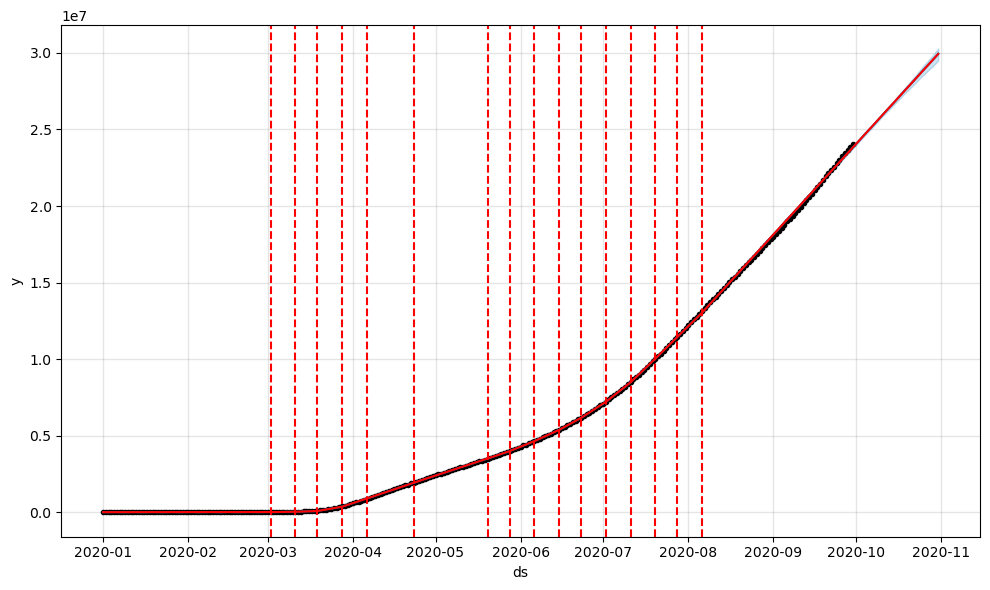

In [97]:
from prophet.plot import add_changepoints_to_plot

# This particular feature helps us identify trend changes that are infered by the model

fig = m.plot(forecast)
a = add_changepoints_to_plot(fig.gca(), m, forecast)


This feature of changepoints allows us to see, according to the model, where the data took a sudden change in its trajectory. It's visible that at all the changepoints, the trajectory of increase in cases only became more steep

#### ASSESS THE PERFORMANCE OF THE MODEL

In [111]:
# Assess the performance of the model

score = r2_score(test['y'], forecast[forecast['ds'] >= '2020-10-01']['yhat'])

print('R-Sqaure score is {}'.format(score))

R-Sqaure score is 0.6812854538118487


The R Square of Coefficient of Determination is 0.68, which means that 68% of the data is explained by the model, this is not bad, but not excellent either. The threshold for good performance can depend on the project

In [112]:
# Add the predicted values to the original dataframe for plotting purpose

data_agg['predicted'] = forecast['yhat']

In [113]:
data_agg

,ds,y,predicted
0,2020-01-01,0.0,-6.619577e+03
1,2020-01-02,0.0,-7.963423e+03
2,2020-01-03,0.0,-2.307846e+03
3,2020-01-04,0.0,5.994091e+03
4,2020-01-05,0.0,8.745211e+03
...,...,...,...
300,2020-10-27,31344249.0,2.914603e+07
301,2020-10-28,31691206.0,2.934159e+07
302,2020-10-29,32066452.0,2.953686e+07
303,2020-10-30,32469621.0,2.973913e+07


In [114]:
# Function to plot the forecast and the origianl values for comparison

def interactive_plot_forecasting(df, title):
    fig = px.line(title = title)
    for i in df.columns[1:]:
        fig.add_scatter(x = df['ds'],y = df[i], name = i)
    fig.show()

In [115]:
interactive_plot_forecasting(data_agg, 'Original Vs Predicted')

It is observable that the model underpredicted the case count for the month of October. While the gap was not very significant up till about october 15, it seems that another changepoint ramped up the trajectory of cases which our model was unable to forsee